<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction</a></span></li><li><span><a href="#Data-Description" data-toc-modified-id="Data-Description-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data Description</a></span></li><li><span><a href="#Importing-libraries-and-loading-dataset" data-toc-modified-id="Importing-libraries-and-loading-dataset-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Importing libraries and loading dataset</a></span></li><li><span><a href="#EDA" data-toc-modified-id="EDA-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>EDA</a></span></li><li><span><a href="#Model-Selection" data-toc-modified-id="Model-Selection-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Model Selection</a></span></li><li><span><a href="#Test-set-prediction" data-toc-modified-id="Test-set-prediction-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Test set prediction</a></span></li></ul></div>

# Introduction

Company Introduction
Your client for this project is a major producer of solar energy.

Recently the company has taken an initiative to make waste-free power source which could be a potential leap towards protecting the environment and climate change.
They have partnered with NASA to get a hold on the meteorological data so that they could build an efficient system to measure solar radiation.
They have been working on an app which gives updates on solar radiation throughout different timestamps during the day.

Current Scenario
Solar radiation is often defined as the energy reaching the earth from the sun.
People have been measuring the energy coming from the sun for centuries, and today more people are measuring solar radiation than ever before. But we are still in need of an efficient and accurate way of measuring solar radiation

The current process suffers from the following problems:

The solar radiation is dependent on Humidity and Temperature.
Measuring solar radiation using different devices requires a lot of manpower and resources.
It takes a lot of time fixing the sensors and interpreting the readings from the different devices which becomes inefficient as time goes by.

The company has hired you as data science consultants. They want to automate the process of predicting the compressive strength of the concrete, based on the materials used.

Your Role
You are given a dataset containing measurements for the past 4 months.
Your task is to build a regression model using the dataset.
Because there was no machine learning model for this problem in the company, you don’t have a quantifiable win condition. You need to build the best possible model.

Project Deliverables
Deliverable: Solar Radiation Prediction.
Machine Learning Task: Regression
Target Variable: Radiation
Win Condition: N/A (best possible model)


# Data Description

In [ ]:
'' ' ' ''''
Dataset Feature Description
The Dataset contains the following columns:

Column Name	Description
Id	Unique identity of each observation.
UNIXTime	Track time as a running total of seconds.
Data	Day and time at which the reading was started in hh:mm: ss 24-hour format.
Time	Time at which the reading was taken in 24-hour format.
Temperature	Temperature during the daytime in degrees Fahrenheit(°F).
Pressure	Barometric pressure(Hg).
Humidity	Humidity per cent during the daytime(%).
WindDirection(Degrees)	Direction of wind in degrees (°).
Speed	Speed of wind in miles per hour (mph).
TimeSunRise	Time of sunrise in the morning(Hawaii time).
TimeSunSet	Time of sunset in the evening(Hawaii time).
Radiation	Solar radiation measured in watts per meter^2 (W/m2).
 
'' ' '''

# Importing libraries and loading dataset

In [4]:
!pip install -q datascience                   # Package that is required by pandas profiling
!pip install -q pandas-profiling              # Toolbox for Generating Statistics Report
!pip install -q yellowbrick                   # Toolbox for Measuring Machine Performance
!pip install -q imbalanced-learn              # Toolbox for Imbalanced Dataset
!pip install -q category-encoders             # Transformers Toolbox to Encode Categorical Variables as Numeric

     |████████████████████████████████| 69 kB 6.8 MB/s 


In [5]:
!pip install -q --upgrade pandas-profiling
!pip install -q --upgrade yellowbrick

     |████████████████████████████████| 261 kB 28.2 MB/s 
     |████████████████████████████████| 636 kB 48.7 MB/s 
     |████████████████████████████████| 675 kB 47.3 MB/s 
     |████████████████████████████████| 62 kB 803 kB/s 
     |████████████████████████████████| 3.1 MB 40.7 MB/s 
     |████████████████████████████████| 10.1 MB 34.1 MB/s 
     |████████████████████████████████| 102 kB 10.7 MB/s 
     |████████████████████████████████| 812 kB 51.4 MB/s 
     |████████████████████████████████| 28.5 MB 47 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 271 kB 30.1 MB/s 


In [15]:
# For Panel Data Analysis
import pandas as pd
from pandas_profiling import ProfileReport
import pandas.util.testing as tm
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_rows', None)
pd.set_option('mode.chained_assignment', None)

# For Numerical Python
import numpy as np

# For Random seed values
from random import randint

# For Scientifc Python
from scipy import stats

# For datetime
from datetime import datetime as dt

# For Data Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from plotly.offline import plot

# For Preprocessing
from sklearn.preprocessing import StandardScaler

# For Encoding Categorical Features
from category_encoders import TargetEncoder

# For Feature Selection
from sklearn.feature_selection import SelectFromModel

# For Feature Importances
from yellowbrick.model_selection import FeatureImportances

# For metrics evaluation
from sklearn.metrics import mean_squared_error, r2_score

# For Data Modeling
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# To Disable Warnings
import warnings
warnings.filterwarnings(action = "ignore")

In [2]:
df=pd.read_csv('solar_train.csv')

# EDA

In [3]:
df.head()

,Id,UNIXTime,Data,Time,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet,Radiation
0,4152,1473879005,9/14/2016 12:00:00 AM,08:50:05,57,30.45,68,26.70,4.50,06:10:00,18:26:00,680.04
1,13047,1476293121,10/12/2016 12:00:00 AM,07:25:21,50,30.47,96,144.96,10.12,06:16:00,18:02:00,277.37
2,7420,1477993220,10/31/2016 12:00:00 AM,23:40:20,47,30.48,56,119.52,3.37,06:23:00,17:49:00,1.29
3,6508,1473013505,9/4/2016 12:00:00 AM,08:25:05,57,30.47,93,38.61,2.25,06:08:00,18:35:00,544.75
4,29110,1481885434,12/16/2016 12:00:00 AM,00:50:34,41,30.23,103,177.55,2.25,06:50:00,17:46:00,1.22


In [4]:
df.shape

(26148, 12)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26148 entries, 0 to 26147
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Id                      26148 non-null  int64  
 1   UNIXTime                26148 non-null  int64  
 2   Data                    26148 non-null  object 
 3   Time                    26148 non-null  object 
 4   Temperature             26148 non-null  int64  
 5   Pressure                26148 non-null  float64
 6   Humidity                26148 non-null  int64  
 7   WindDirection(Degrees)  26148 non-null  float64
 8   Speed                   26148 non-null  float64
 9   TimeSunRise             26148 non-null  object 
 10  TimeSunSet              26148 non-null  object 
 11  Radiation               26148 non-null  float64
dtypes: float64(4), int64(4), object(4)
memory usage: 2.4+ MB


In [6]:
df.describe()

,Id,UNIXTime,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,Radiation
count,26148.000000,2.614800e+04,26148.000000,26148.000000,26148.000000,26148.000000,26148.000000,26148.000000
mean,16337.578668,1.478046e+09,51.104865,30.422835,75.005239,143.259970,6.248521,208.044780
std,9449.975676,3.005885e+06,6.213912,0.054724,25.993102,82.988177,3.484166,316.090247
min,0.000000,1.472724e+09,34.000000,30.190000,11.000000,0.090000,0.000000,1.130000
25%,8125.750000,1.475533e+09,46.000000,30.400000,56.000000,81.977500,3.370000,1.230000
50%,16379.000000,1.478038e+09,50.000000,30.430000,85.000000,147.645000,5.620000,2.710000
75%,24507.250000,1.480478e+09,55.000000,30.460000,97.000000,179.220000,7.870000,358.945000
max,32685.000000,1.483265e+09,71.000000,30.560000,103.000000,359.950000,39.370000,1601.260000


In [7]:
df.isnull().sum()

Id                        0
UNIXTime                  0
Data                      0
Time                      0
Temperature               0
Pressure                  0
Humidity                  0
WindDirection(Degrees)    0
Speed                     0
TimeSunRise               0
TimeSunSet                0
Radiation                 0
dtype: int64

In [8]:
zero=(df==0).sum()
zero

Id                        1  
UNIXTime                  0  
Data                      0  
Time                      0  
Temperature               0  
Pressure                  0  
Humidity                  0  
WindDirection(Degrees)    0  
Speed                     375
TimeSunRise               0  
TimeSunSet                0  
Radiation                 0  
dtype: int64

In [9]:
df.duplicated().any()

False

In [3]:
df['Data'] = pd.to_datetime(df['Data'])
df['Time'] = pd.to_datetime(df['Time'])
df['TimeSunRise'] = pd.to_datetime(df['TimeSunRise'])
df['TimeSunSet'] = pd.to_datetime(df['TimeSunSet'])


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26148 entries, 0 to 26147
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Id                      26148 non-null  int64         
 1   UNIXTime                26148 non-null  int64         
 2   Data                    26148 non-null  datetime64[ns]
 3   Time                    26148 non-null  datetime64[ns]
 4   Temperature             26148 non-null  int64         
 5   Pressure                26148 non-null  float64       
 6   Humidity                26148 non-null  int64         
 7   WindDirection(Degrees)  26148 non-null  float64       
 8   Speed                   26148 non-null  float64       
 9   TimeSunRise             26148 non-null  datetime64[ns]
 10  TimeSunSet              26148 non-null  datetime64[ns]
 11  Radiation               26148 non-null  float64       
dtypes: datetime64[ns](4), float64(4), int64(4)
mem

In [6]:
import pandas_profiling as pp
profile = pp.ProfileReport(df, title = "EDA")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

     |████████████████████████████████| 44 kB 2.3 MB/s 
Imported AutoViz_Class version: 0.0.84. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


Shape of your Data Set loaded: (26148, 12)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  3
    Number of Integer-Categorical Columns =  2
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  4
    Number of ID Columns =  2
    Number of Columns to Delete =  0
    11 Predictors classified...
        This does not include the Target column(s)
        2 variables removed since they were ID or low-information variables
    List of variables removed: ['Id', 'UNIXTime']

################ Regression VISUALIZATION Started #####################
Data Set Shape: 26148 rows, 10 cols
Data Set columns info:
* Data: 0 nulls, 118 unique vals, most common: {Timestamp

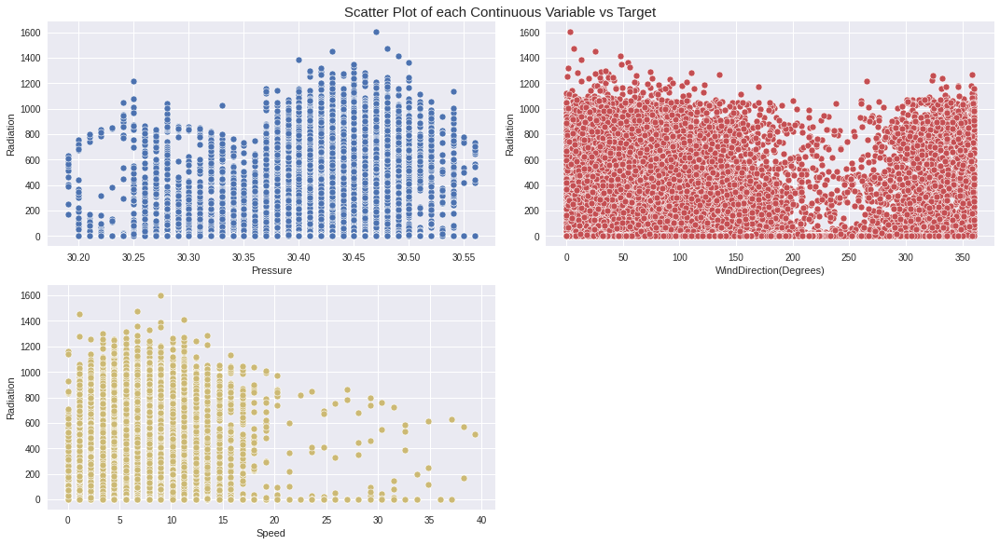

Number of All Scatter Plots = 6


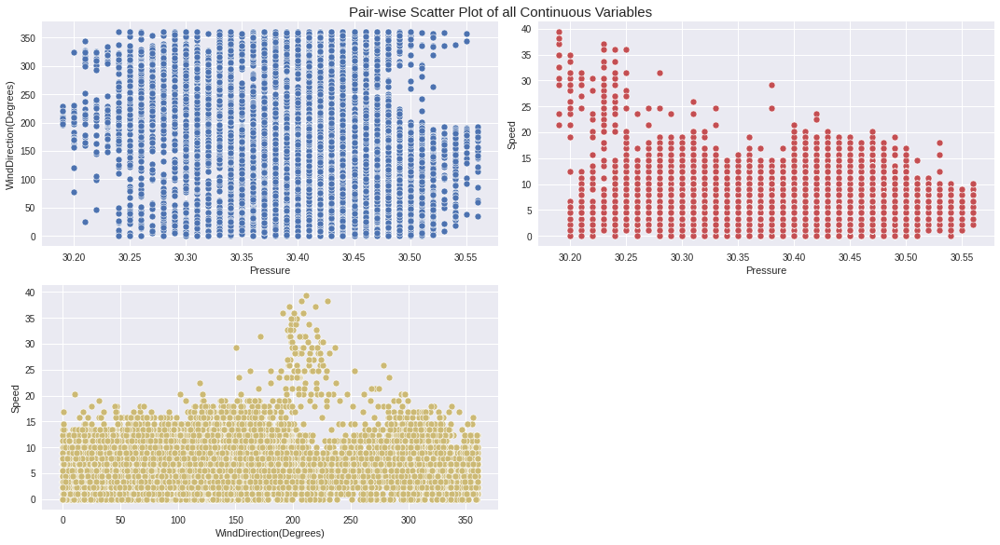

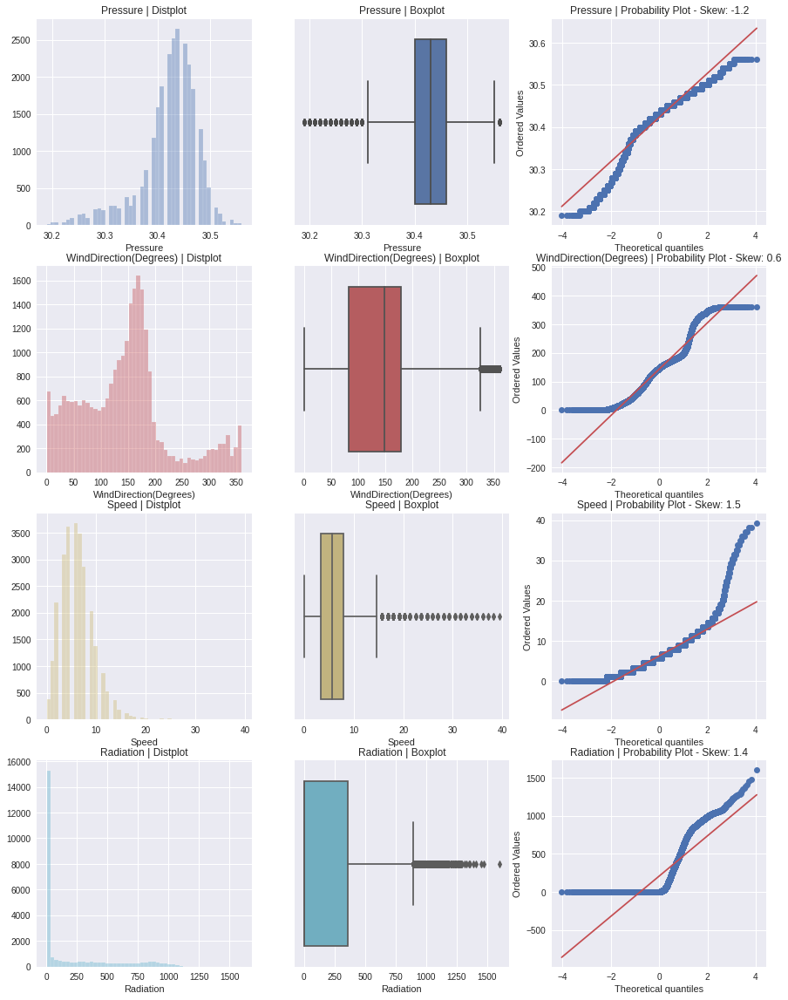

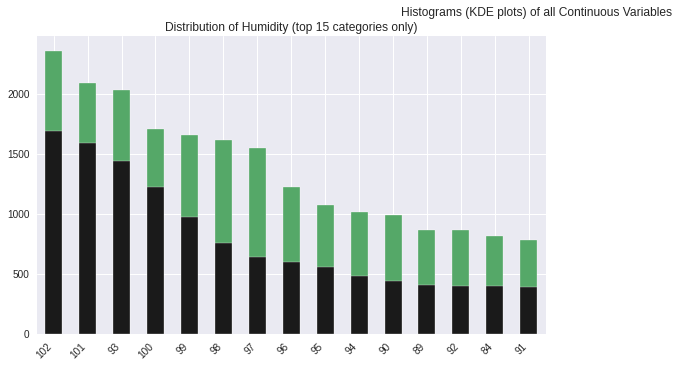

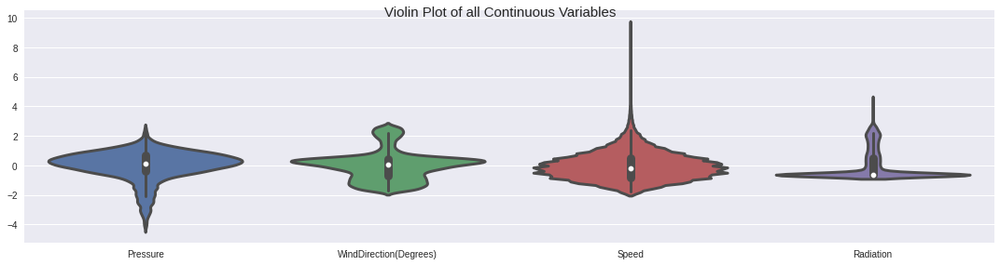

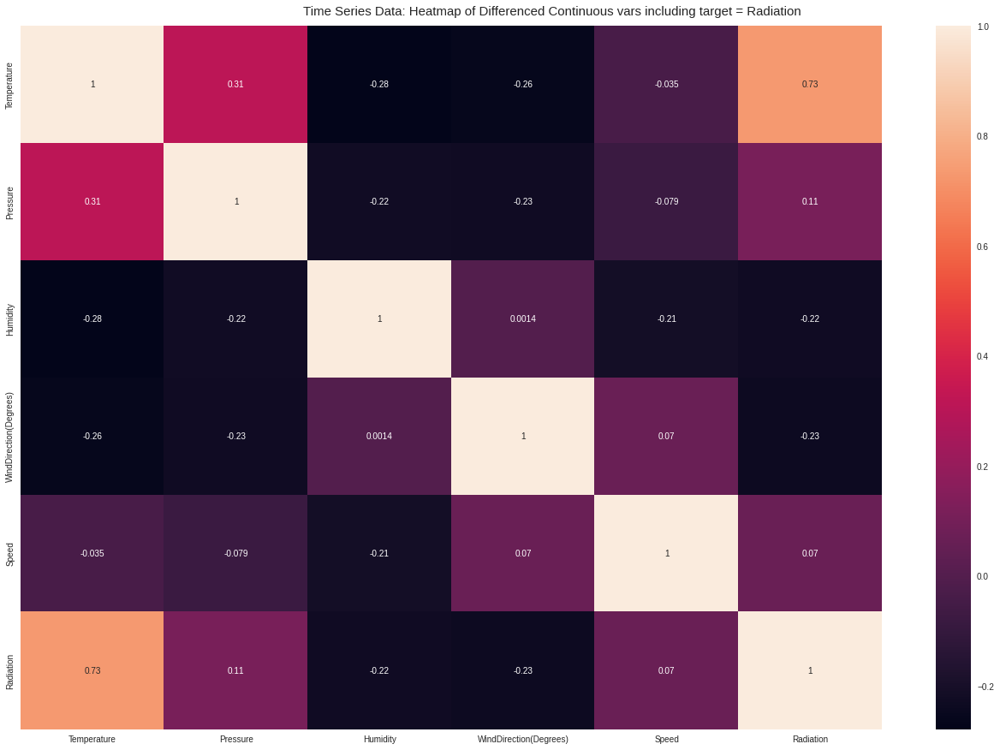

Could not draw Time Series plots


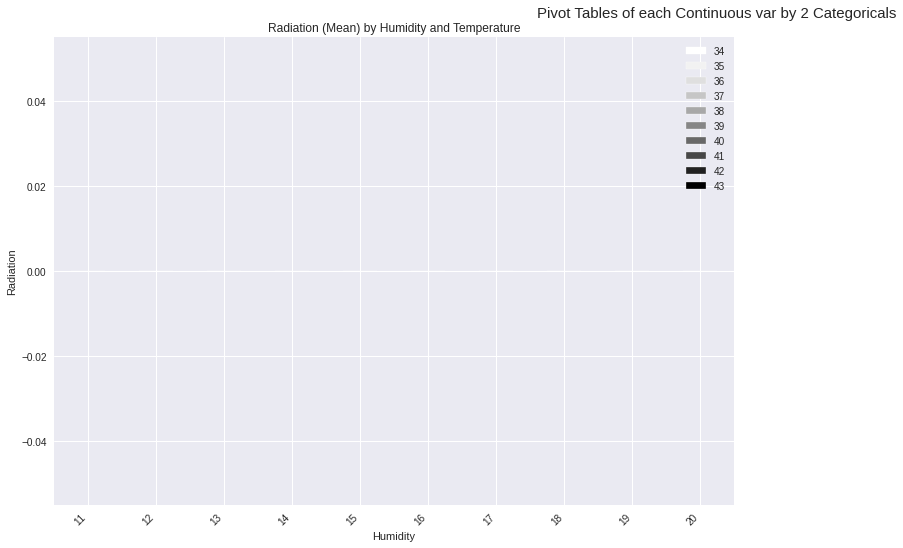

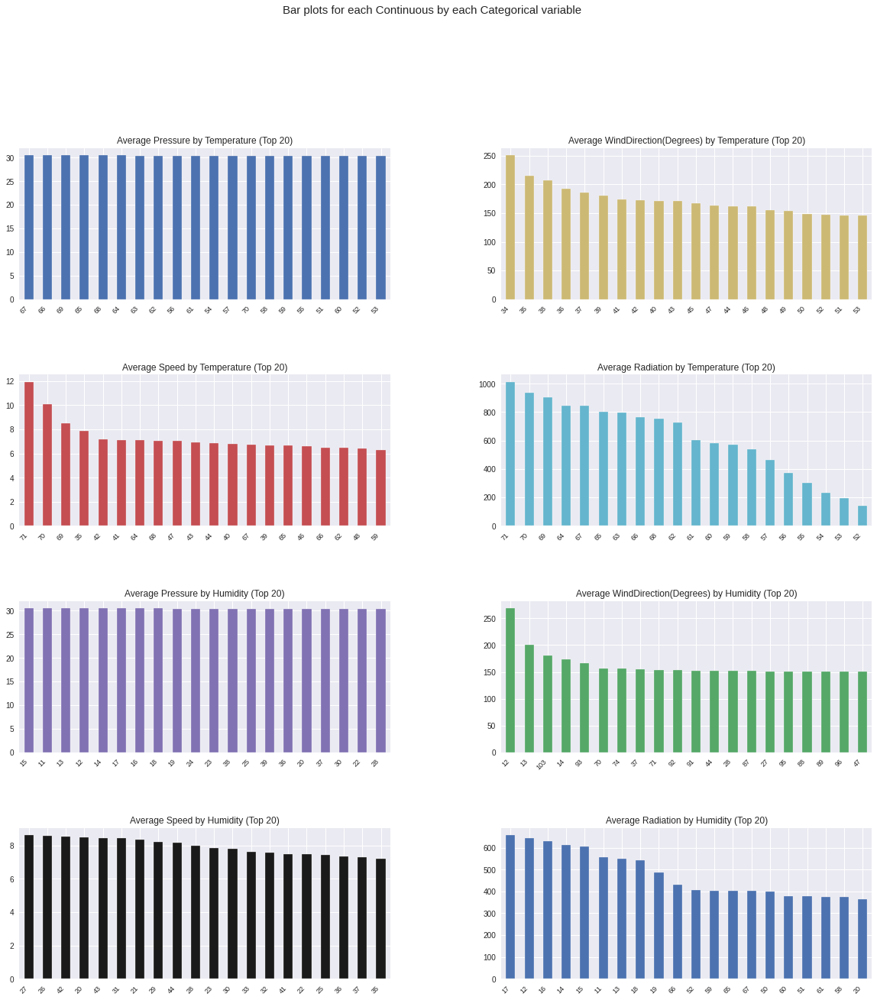

All Plots done
Time to run AutoViz (in seconds) = 13.777

 ###################### VISUALIZATION Completed ########################


In [9]:
viz = AV.AutoViz(filename="",sep=',', depVar='Radiation', dfte=df, header=0, verbose=1, 
                 lowess=False, chart_format='svg')

In [16]:
import dtale
import dtale.app as dtale_app

dtale_app.USE_COLAB = True

dtale.show(df)

https://mv7kc1ogbke-496ff2e9c6d22116-40000-colab.googleusercontent.com/dtale/main/1

In [17]:
num_feature = []

for i in df.columns.values:
  if ((df[i].dtype == int) | (df[i].dtype == float)):
    num_feature.append(i)
    
print('Total Numerical Features:', len(num_feature))
print('Features:', num_feature)

Total Numerical Features: 8
Features: ['Id', 'UNIXTime', 'Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed', 'Radiation']


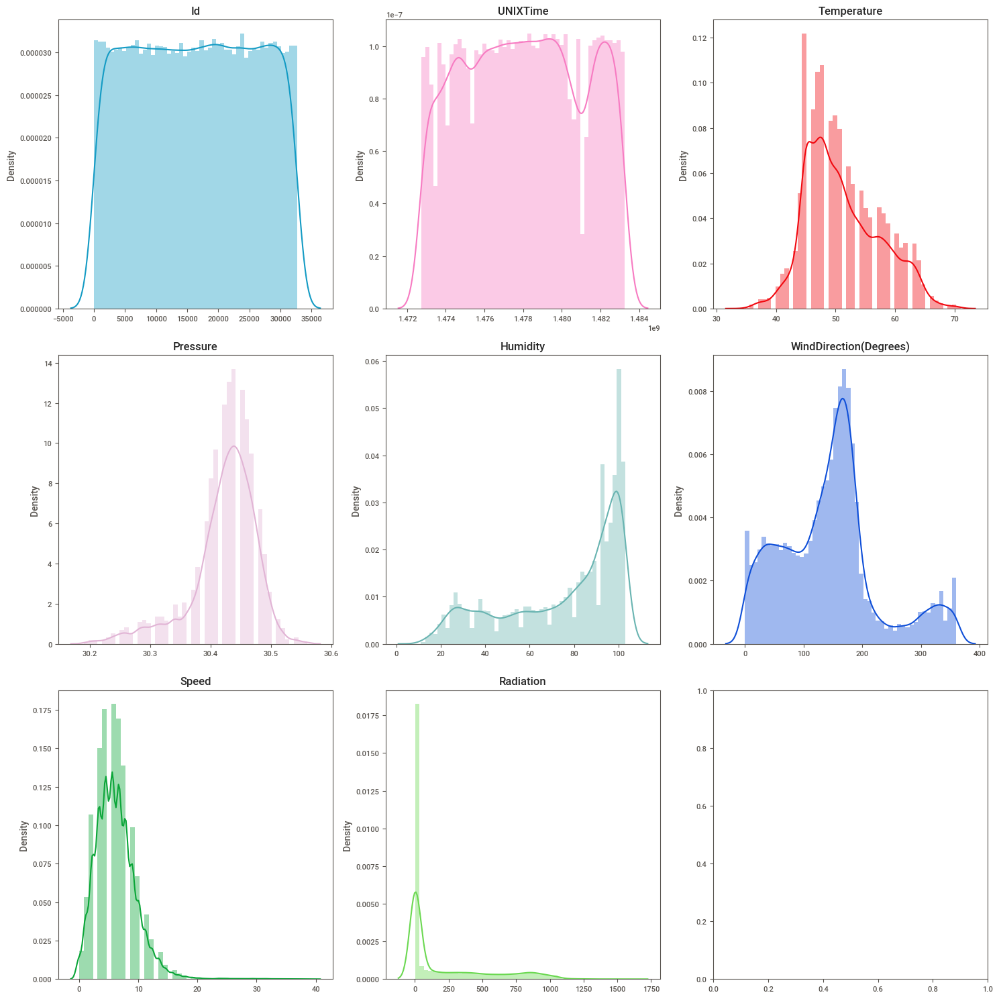

In [23]:
# Creating subplots
fig, axes = plt.subplots(nrows = 3, ncols = 3, sharex = False, figsize=(15, 15))

# Generating random colors based on number of columns
colors = []
for i in range(len(num_feature)):
  colors.append('#%06X' % randint(0, 0xFFFFFF))   
                
for ax, col, color in zip(axes.flat, num_feature, colors):
  sns.distplot(a = df[col], bins = 50, ax = ax, color = color)
  ax.set_title(col)
  plt.setp(axes, xlabel = '')
  ax.grid(False)
plt.tight_layout()
plt.show()

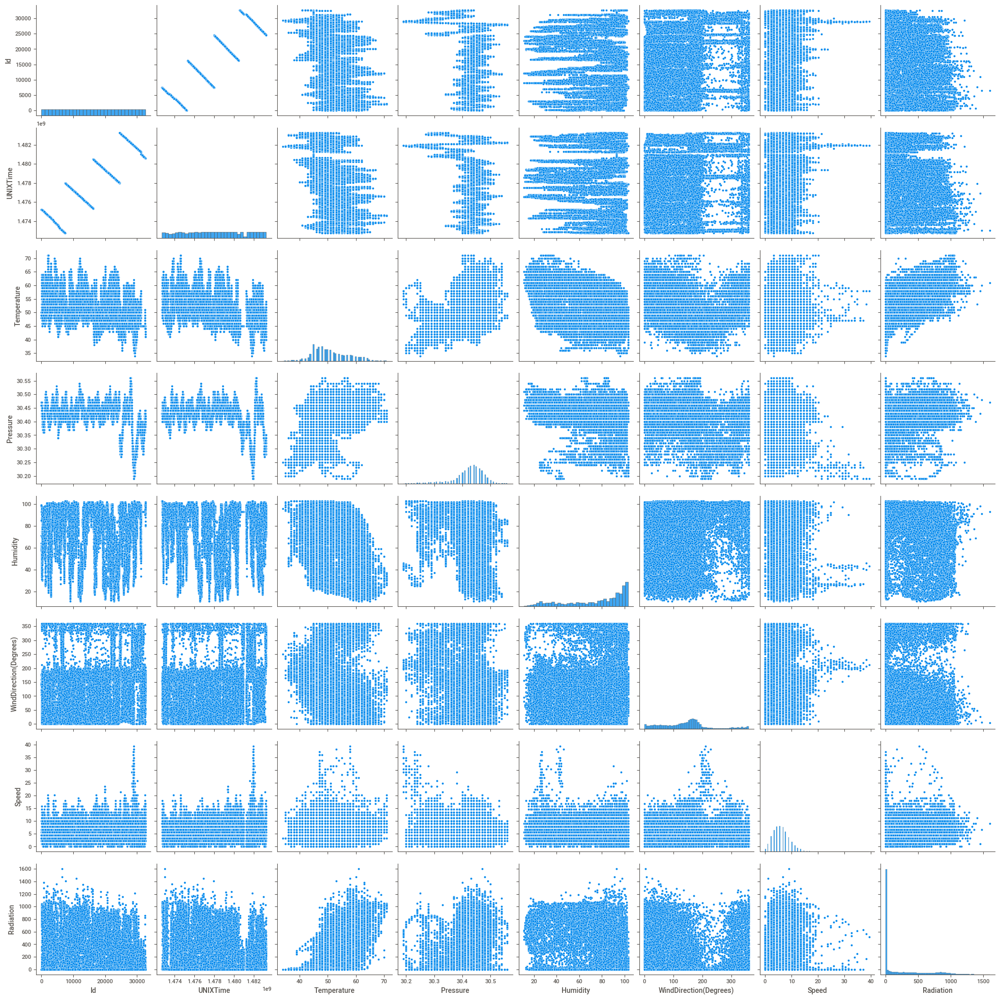

In [24]:
sns.pairplot(df)

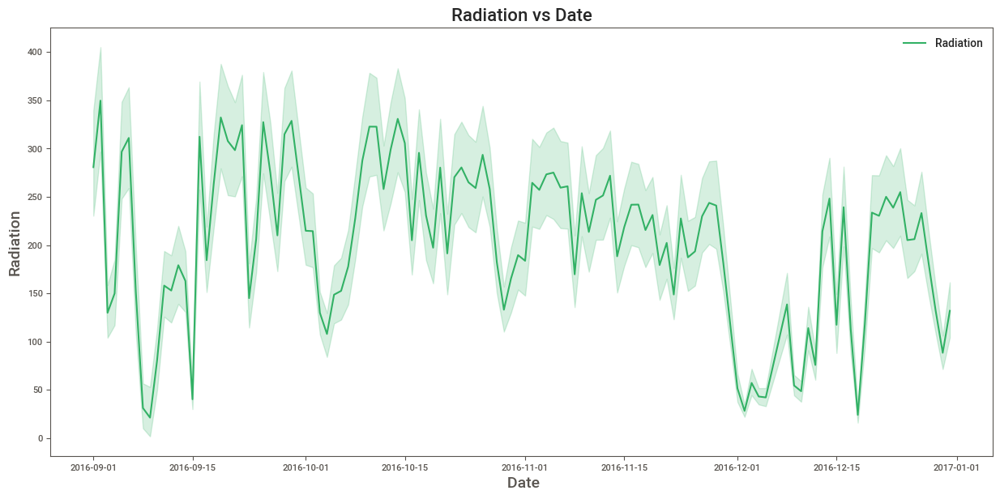

In [27]:
figure = plt.figure(figsize = [15, 7])
sns.lineplot(x = 'Data', y = 'Radiation', data = df, color = '#32B165')

plt.xlabel(' Date', size = 14)
plt.ylabel('Radiation', size = 14)
plt.legend(labels = ['Radiation'], loc = 'upper right', frameon = False)
plt.title('Radiation vs Date', size = 16)
plt.show()

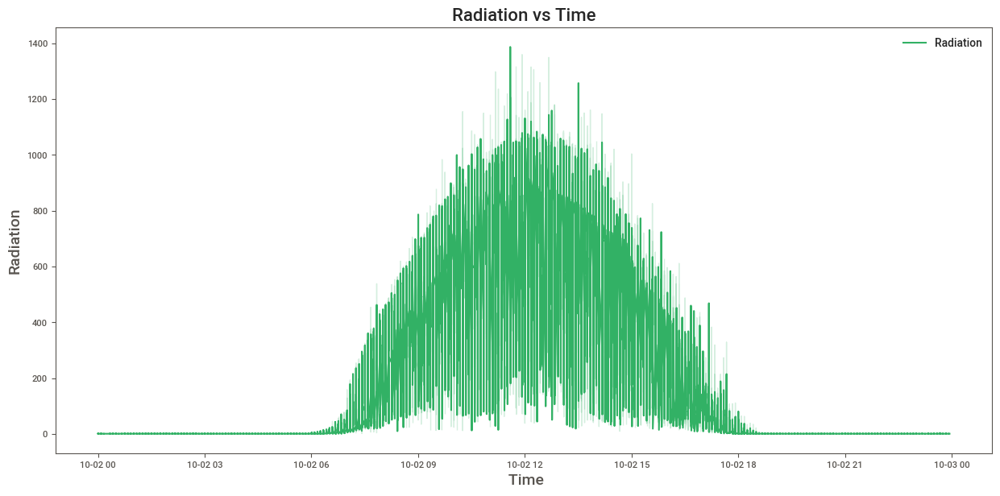

In [28]:
figure = plt.figure(figsize = [15, 7])
sns.lineplot(x = 'Time', y = 'Radiation', data = df, color = '#32B165')

plt.xlabel(' Time', size = 14)
plt.ylabel('Radiation', size = 14)
plt.legend(labels = ['Radiation'], loc = 'upper right', frameon = False)
plt.title('Radiation vs Time', size = 16)
plt.show()

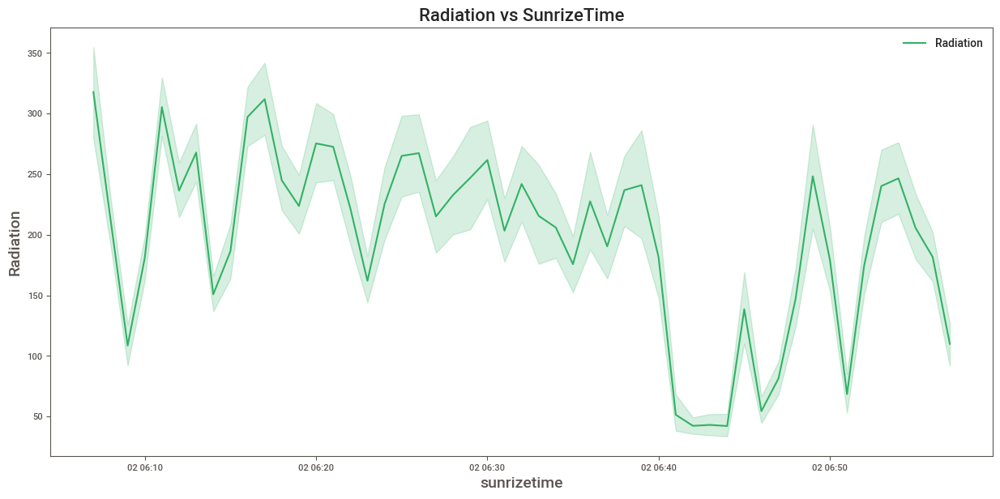

In [29]:
figure = plt.figure(figsize = [15, 7])
sns.lineplot(x = 'TimeSunRise', y = 'Radiation', data = df, color = '#32B165')

plt.xlabel('sunrizetime', size = 14)
plt.ylabel('Radiation', size = 14)
plt.legend(labels = ['Radiation'], loc = 'upper right', frameon = False)
plt.title('Radiation vs SunrizeTime', size = 16)
plt.show()

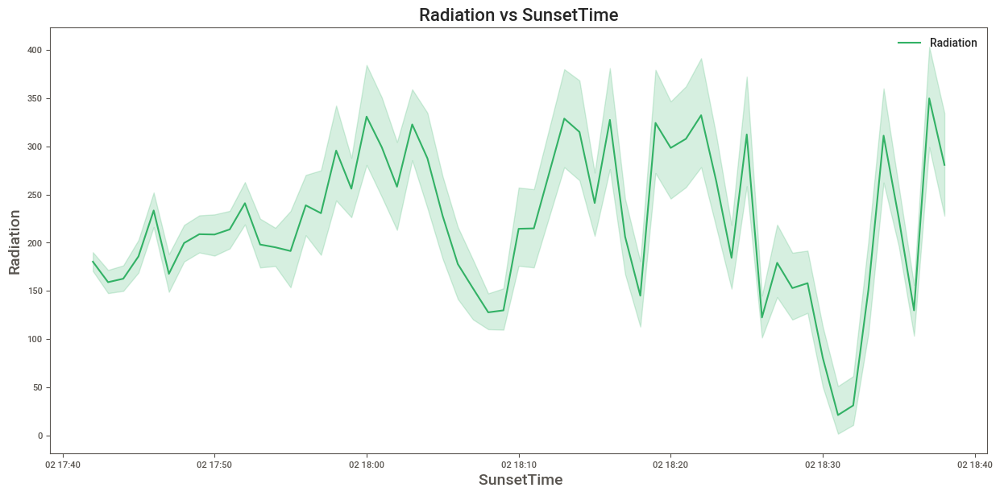

In [30]:
figure = plt.figure(figsize = [15, 7])
sns.lineplot(x = 'TimeSunSet', y = 'Radiation', data = df, color = '#32B165')

plt.xlabel(' SunsetTime', size = 14)
plt.ylabel('Radiation', size = 14)
plt.legend(labels = ['Radiation'], loc = 'upper right', frameon = False)
plt.title('Radiation vs SunsetTime', size = 16)
plt.show()

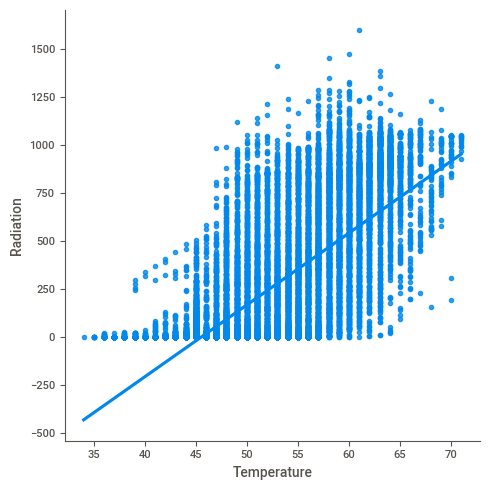

In [32]:
sns.lmplot(x='Temperature',y='Radiation',data=df)

# Model Selection

In [1]:
import pycaret
from pycaret.regression import *

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [3]:
reg = setup(data = df, target = 'Radiation')

,Description,Value
0,session_id,5362
1,Target,Radiation
2,Original Data,"(26148, 12)"
3,Missing Values,False
4,Numeric Features,7
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(18303, 58)"


In [4]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
knn,K Neighbors Regressor,28.2972,5832.3757,76.2427,0.9419,0.3049,0.2269,0.214
rf,Random Forest Regressor,33.0571,6653.0554,81.5142,0.9337,0.3969,0.4278,14.502
et,Extra Trees Regressor,32.4266,6777.0491,82.2767,0.9325,0.3689,0.3476,9.022
lightgbm,Light Gradient Boosting Machine,43.2877,7571.0312,86.9596,0.9245,0.9666,3.0928,0.261
dt,Decision Tree Regressor,40.7927,11697.8719,108.0151,0.8834,0.4258,0.3884,0.257
gbr,Gradient Boosting Regressor,62.7318,12429.7974,111.4489,0.8761,1.4507,7.2814,2.871
br,Bayesian Ridge,90.0557,17263.5290,131.3397,0.8279,2.1189,19.2401,0.099
ridge,Ridge Regression,90.2953,17345.6053,131.6510,0.8271,2.1196,19.2666,0.032
lasso,Lasso Regression,96.4154,18601.9457,136.3511,0.8147,2.2374,22.5952,0.249
omp,Orthogonal Matching Pursuit,138.6474,34357.0437,185.3355,0.6580,2.6535,40.8350,0.032


KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                    weights='uniform')

In [5]:
knn = create_model('knn')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,26.9058,5146.8223,71.7414,0.9508,0.2773,0.1989
1,31.1465,7347.9692,85.7203,0.9249,0.2998,0.2141
2,26.8509,5107.0083,71.4633,0.9502,0.2846,0.2086
3,28.4510,5444.5366,73.7871,0.9447,0.3066,0.2363
4,30.1633,6396.9829,79.9811,0.9360,0.3403,0.2433
5,27.6229,6113.0469,78.1860,0.9426,0.3006,0.2204
6,25.9735,5225.0513,72.2845,0.9461,0.3105,0.2245
7,27.0842,5696.4800,75.4750,0.9450,0.3107,0.2493
8,27.9522,5431.5166,73.6988,0.9450,0.3018,0.2279
9,30.8219,6414.3428,80.0896,0.9334,0.3167,0.2457


In [6]:
predictions = predict_model(knn)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,K Neighbors Regressor,28.1782,6203.536621,78.762497,0.9369,0.2916,0.2079


In [7]:
tuned_knn=tune_model(knn)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,27.7327,4599.6718,67.8209,0.9560,0.4371,0.4885
1,32.1477,6724.1241,82.0008,0.9313,0.4540,0.5076
2,28.8898,5420.4993,73.6240,0.9472,0.4520,0.5289
3,30.0975,5248.7999,72.4486,0.9467,0.4763,0.5872
4,31.4655,6075.1333,77.9431,0.9392,0.4985,0.5814
5,28.6049,5780.7907,76.0315,0.9457,0.4617,0.5372
6,27.1543,4740.0073,68.8477,0.9511,0.4542,0.5072
7,29.1122,5698.1078,75.4858,0.9449,0.4943,0.6425
8,28.3959,5095.8303,71.3851,0.9484,0.4857,0.6005
9,32.0753,5924.4366,76.9704,0.9385,0.4858,0.5915


In [8]:
tuned_knn

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=-1, n_neighbors=16, p=2,
                    weights='distance')

In [12]:
df.drop(columns=['Id','Data','Time','TimeSunRise','TimeSunSet'],inplace=True)

In [13]:
X = df.drop('Radiation', axis = 1)
y = df['Radiation']

In [16]:
selector = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state = 42, n_jobs = -1))
selector.fit(X, y)

# Extracting list of important features
selected_feat = X.columns[(selector.get_support())].tolist()

print('Total Features Selected are', len(selected_feat))

# Estimated by taking mean(default) of feature importance
print('Threshold set by Model:', np.round(selector.threshold_, decimals = 2))
print('Features:', selected_feat)

Total Features Selected are 2
Threshold set by Model: 0.17
Features: ['UNIXTime', 'Temperature']


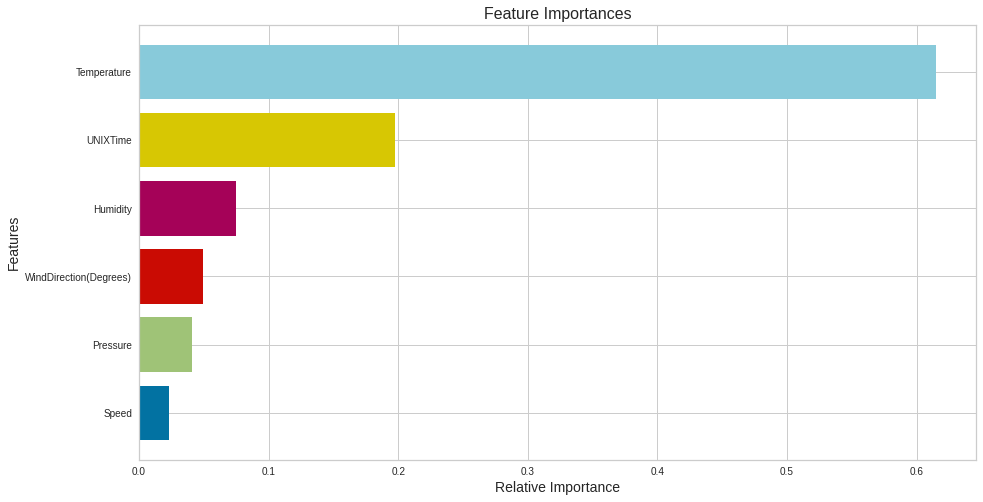

In [17]:
figure = plt.figure(figsize = [15, 8])

# If you don't want relative importance, use relative = False in below method
viz = FeatureImportances(selector.estimator, relative = False)
viz.fit(X, y)

plt.xlabel('Relative Importance', size = 14)
plt.ylabel('Features', size = 14)
plt.title(label = 'Feature Importances', size = 16)
plt.show()

In [19]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [20]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train=scaler.fit_transform(x_train)
x_test=scaler.transform(x_test)

In [25]:
def PlotScore(y_train, y_train_pred, y_test, y_test_pred):
  '''
  Plot visual of acutal and predicted for train & test data
  y_train: actual values of y train
  y_train_pred: predicted values of y_train
  y_test: actual values of y_test
  y_test_pred: predicted values of y_test
  '''
  plt.figure(figsize = [13.66, 6])
  plt.subplot(1, 2, 1)
  sns.lineplot(x = y_train, y = y_train_pred, marker = 'o')
  plt.xlabel('Actual')
  plt.ylabel('Predicted')
  plt.title('For Train Data')

  plt.subplot(1, 2, 2)
  sns.lineplot(x = y_test, y = y_test_pred, marker = 'o')
  plt.xlabel('Actual')
  plt.ylabel('Predicted')
  plt.title('For Test Data')
  plt.show()

Acutal Values: [667.73   1.24   1.23   8.07   1.24]
Predicted Values: [617.5027  38.1994   3.8117   5.9401   7.2788]
RMSE (Train Data): 38.43
RMSE (Test Data): 101.32
R-Squared (Train Data): 99.0 %
R-Squared (Test Data): 90.0 %


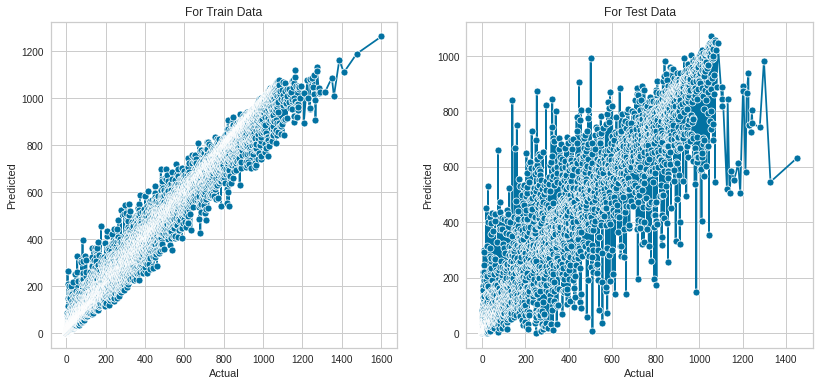

In [38]:

random_forest = RandomForestRegressor(random_state = 42)
random_forest.fit(x_train, y_train)

y_train_pred = random_forest.predict(x_train)
y_test_pred = random_forest.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(random_forest.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(random_forest.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

Acutal Values: [667.73   1.24   1.23   8.07   1.24]
Predicted Values: [562.46308593  66.8283885   37.80541917   3.98379679  12.58537231]
RMSE (Train Data): 0.0
RMSE (Test Data): 148.06
R-Squared (Train Data): 100.0 %
R-Squared (Test Data): 78.0 %


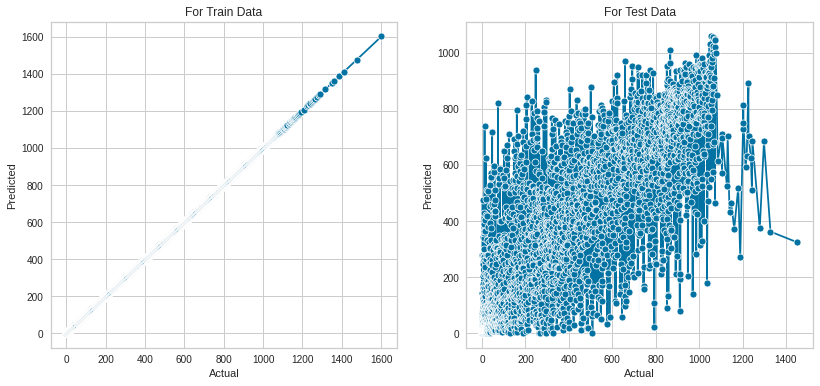

In [27]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=-1, n_neighbors=16, p=2,
                    weights='distance')
knn.fit(x_train, y_train)

y_train_pred =knn.predict(x_train)
y_test_pred = knn.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(knn.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(knn.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

Acutal Values: [667.73   1.24   1.23   8.07   1.24]
Predicted Values: [ 578.62724004  148.77359279  -35.34501911 -159.631114    108.38814247]
RMSE (Train Data): 201.21
RMSE (Test Data): 199.1
R-Squared (Train Data): 60.0 %
R-Squared (Test Data): 60.0 %


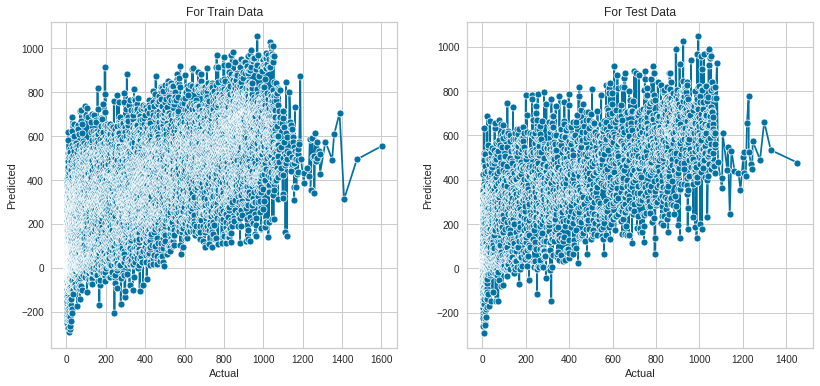

In [28]:
lr = LinearRegression()
lr.fit(x_train, y_train)

y_train_pred = lr.predict(x_train)
y_test_pred = lr.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(lr.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(lr.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

In [31]:
parameter_grid = [{'n_estimators' : [10, 15, 20, 25], 'bootstrap' : [True, False], 'max_depth' : [20, 25, 26, 27, 28, 29, 30], 'oob_score': [True, False]}]

In [32]:
# Have some patience, may take some time :)
rand_forest = RandomForestRegressor(random_state = 42, n_jobs = -1)
random_search = GridSearchCV(estimator = rand_forest, param_grid = parameter_grid, scoring = 'neg_mean_squared_error', n_jobs = -1, cv = 10, return_train_score = True)
random_search.fit(x_train, y_train)
random_search.best_estimator_

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=25, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=25, n_jobs=-1, oob_score=True,
                      random_state=42, verbose=0, warm_start=False)

In [33]:
random_search.best_params_

{'bootstrap': True, 'max_depth': 25, 'n_estimators': 25, 'oob_score': True}

Acutal Values: [667.73   1.24   1.23   8.07   1.24]
Predicted Values: [611.1068      35.1824       3.91802441   5.25721726   6.0679768 ]
RMSE (Train Data): 42.34
RMSE (Test Data): 105.56
R-Squared (Train Data): 98.0 %
R-Squared (Test Data): 89.0 %


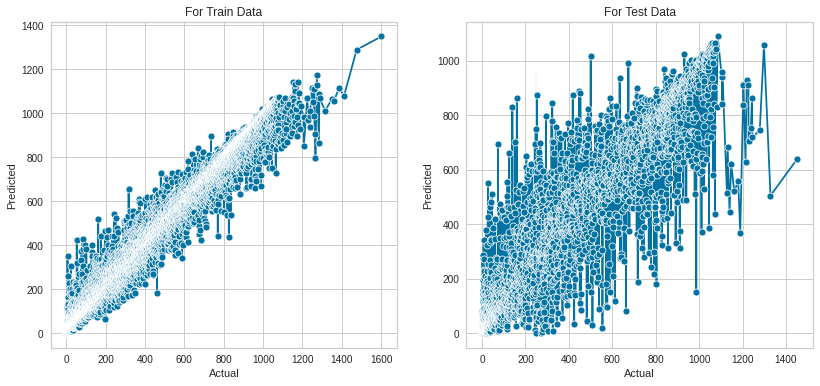

In [34]:
# Have some patience, may take some time :)
random_forest = random_search.best_estimator_
random_forest.fit(x_train, y_train)

y_train_pred = random_forest.predict(x_train)
y_test_pred = random_forest.predict(x_test)

print('Acutal Values:', y_test[0:5].values)
print('Predicted Values:', y_test_pred[0:5])

# Estimating RMSE on Train & Test Data
print('RMSE (Train Data):', np.round(np.sqrt(mean_squared_error(y_true = y_train, y_pred = y_train_pred)), decimals = 2))
print('RMSE (Test Data):', np.round(np.sqrt(mean_squared_error(y_true = y_test, y_pred = y_test_pred)), decimals = 2))

# Estimating R-Squared on Train & Test Data
print('R-Squared (Train Data):', np.round(random_forest.score(x_train, y_train), decimals = 2)*100, '%')
print('R-Squared (Test Data):', np.round(random_forest.score(x_test, y_test), decimals = 2)*100, '%')

# Plotting Acutal vs Predicted values
PlotScore(y_train, y_train_pred, y_test, y_test_pred)

In [36]:
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
def train(model, X, y):
    # train the model
    x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=42)
    model.fit(x_train, y_train)
    
    # predict the training set
    pred = model.predict(x_test)
    
    # perform cross-validation
    cv_score = cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=5)
    cv_score = np.abs(np.mean(cv_score))
    
    print("Model Report")
    print("RMSE:",np.sqrt(mean_squared_error(y_test, pred)))
    print('CV Score:', cv_score)

In [37]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()
train(model, X, y)

Model Report
RMSE: 101.85805882788561
CV Score: 99.5943909303802


# Test set prediction

In [43]:
test=pd.read_csv('solar_test.csv')

In [44]:
test_copy=test.copy()

In [45]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6538 entries, 0 to 6537
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Id                      6538 non-null   int64  
 1   UNIXTime                6538 non-null   int64  
 2   Data                    6538 non-null   object 
 3   Time                    6538 non-null   object 
 4   Temperature             6538 non-null   int64  
 5   Pressure                6538 non-null   float64
 6   Humidity                6538 non-null   int64  
 7   WindDirection(Degrees)  6538 non-null   float64
 8   Speed                   6538 non-null   float64
 9   TimeSunRise             6538 non-null   object 
 10  TimeSunSet              6538 non-null   object 
dtypes: float64(3), int64(4), object(4)
memory usage: 562.0+ KB


In [46]:
test.drop(columns=['Id','Data','Time','TimeSunRise','TimeSunSet'],inplace=True)

In [47]:
test=scaler.transform(test)

In [50]:
pred_y=random_forest.predict(test)

In [51]:
submission = pd.DataFrame({'Id':test_copy['Id'],'Radiation':pred_y})

In [52]:
#Visualize the first 5 rows
submission.head()
submission.to_csv('Submission.csv',header=False,index=False)

In [53]:
submission.head()

,Id,Radiation
0,22107,700.2135
1,3780,977.6177
2,13651,1.4132
3,30473,10.6447
4,9084,1.3034
